<a href="https://colab.research.google.com/github/patmadp16/Image-Classification/blob/master/FlowerModelTrainClassiefier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import os

import tensorflow as tf
import numpy as np
import cv2
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
tf.compat.v1.set_random_seed(2019)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Define Input Parameters
#dim = (150, 150)
dim = (456, 456)
channel = (3, )
input_shape = dim 

#batch size
batch_size = 16

#Epoch
epoch = 10
img_width, img_height = 224, 224

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
train_datagen = ImageDataGenerator(rescale=1. / 255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

val_datagen = ImageDataGenerator(rescale=1. / 255,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  horizontal_flip=True)

In [ ]:
train_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/dMango/train/',
                                                    target_size=(img_width, img_height),
                                                    batch_size=batch_size,
                                                    class_mode='categorical',shuffle=True)

test_generator = test_datagen.flow_from_directory('/content/drive/MyDrive/dMango/test/',
                                                  target_size=(img_width, img_height), batch_size=batch_size,
                                                  class_mode='categorical',shuffle=True)

val_generator = val_datagen.flow_from_directory('/content/drive/MyDrive/dMango/validation/',
                                                target_size=(img_width, img_height),batch_size=batch_size,
                                               class_mode='categorical',shuffle=True)


#train_generator = tf.keras.preprocessing.image_dataset_from_directory(
#  "/content/drive/MyDrive/fixdataset/train/",
#  validation_split=0.2,
#  subset="training",
#  label_mode='categorical',
#  seed=5,
#  image_size=(150, 150),
#  batch_size=batch_size)

#print('Data Train Berhasil Terbuat')

#test_generator = tf.keras.preprocessing.image_dataset_from_directory(
#    "/content/drive/MyDrive/fixdataset/test/",
#  validation_split=0.2,
#  subset="validation",
#  label_mode='categorical',
#  seed=5,
#  image_size=(150, 150),
#  batch_size=batch_size)

#print('Data Testing Berhasil Terbuat')

#val_generator = tf.keras.preprocessing.image_dataset_from_directory(
#    "/content/drive/MyDrive/fixdataset/validation/",
#  validation_split=0.2,
#  subset="validation",
#  label_mode='categorical',
#  seed=5,
#  image_size=(150, 150),
#  batch_size=batch_size)

#print('Data Testing Berhasil Terbuat')

num_class = test_generator.num_classes
labels = train_generator.class_indices.keys()
print("Jumlah step epoch :",len(train_generator))
print("Jumlah validation step epoch :",len(val_generator))

Found 346 images belonging to 2 classes.
Found 44 images belonging to 2 classes.
Found 44 images belonging to 2 classes.
Jumlah step epoch : 22
Jumlah validation step epoch : 3


In [ ]:

def preprocess(img,input_size):
    nimg = img.convert('RGB').resize(input_size, resample= 0)
    img_arr = (np.array(nimg))/255
    return img_arr

def reshape(imgs_arr):
    return np.stack(imgs_arr, axis=0)

In [ ]:
print(labels)

dict_keys(['diseased', 'healthy'])


In [ ]:

def tf_data_generator(generator, input_shape):
    num_class = generator.num_classes
    tf_generator = tf.data.Dataset.from_generator(
        lambda: generator,
        output_types=(tf.float32, tf.float32),
        output_shapes=([None
                        , input_shape[0]
                        , input_shape[1]
                        , input_shape[2]]
                       ,[None, num_class])
    )
    return tf_generator

In [ ]:
#train_data = tf_data_generator(train_generator,input_shape)
#test_data = tf_data_generator(test_generator, input_shape)
#val_data = tf_data_generator(val_generator, input_shape)

In [ ]:
from tensorflow.keras import layers, Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, Dropout, Flatten, Dense

In [ ]:
from keras import backend as K

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=input_shape))

model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(num_class))
#model.add(Activation('sigmoid'))
model.add(Activation('softmax'))


In [ ]:
model.summary()
model.save('/content/drive/MyDrive/dMango/model_saved.h5')
model.load_weights('/content/drive/MyDrive/dMango/model_saved.h5')

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
activation_12 (Activation)   (None, 224, 224, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 222, 222, 32)      9248      
_________________________________________________________________
activation_13 (Activation)   (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 111, 111, 64)     

In [ ]:

#from tensorflow.keras.applications import MobileNetV2

# get base models
#base_model = MobileNetV2(
#    input_shape=input_shape,
#    include_top=False,
#    weights='imagenet',
#    classes=num_class,
#)

In [ ]:
from tensorflow.keras import layers,Sequential
from tensorflow.keras.models import Model

In [ ]:
#Adding custom layers
#x = base_model.output
#x = layers.GlobalAveragePooling2D()(x)
#x = layers.Dropout(0.2)(x)
#x = layers.Dense(4, activation=tf.nn.relu)(x)

#predictions = layers.Dense(num_class, activation="softmax")(x)
#model = Model(inputs=base_model.input, outputs=predictions)
#print("==========================================")


#inputs = tf.keras.Input(shape=(3,))
#x = tf.keras.layers.Dense(4, activation=tf.nn.relu)(inputs)
#outputs = tf.keras.layers.Dense(5, activation=tf.nn.softmax)(x)
#model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
#from tensorflow.keras.optimizers import RMSprop,SGD,Adam
# Compile the model
print('Compiling Model_1.......')
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


Compiling Model_1.......


In [ ]:
import tensorflow as tf

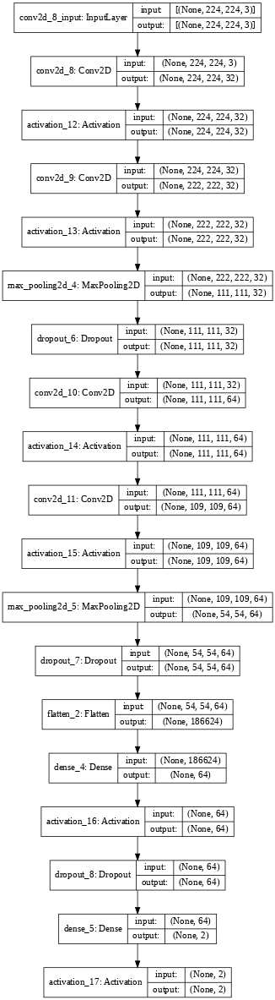

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='/content/drive/MyDrive/dMango/model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

In [ ]:
import tensorflow as tf
EPOCH = 10
history = model.fit(train_generator,
        steps_per_epoch=len(train_generator),
        epochs=EPOCH,
        validation_data=val_generator,
        validation_steps=len(val_generator),
        shuffle=True)
#bs=30         #Setting batch size
#history = model.fit(train_data,
#                    validation_data=test_generator,
#                   epochs=30)


#model.fit_generator( ..., 
#                    validation_data=val_datagen.flow(val_X, val_y, batch_size=BATCH_SIZE), 
#                    nb_val_samples=val_X.shape[0])


Epoch 1/10
22/22 [==============================] - 209s 9s/step - loss: 0.6521 - accuracy: 0.6532 - val_loss: 0.3641 - val_accuracy: 0.9545
Epoch 2/10
22/22 [==============================] - 201s 9s/step - loss: 0.1788 - accuracy: 0.9393 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 3/10
22/22 [==============================] - 201s 9s/step - loss: 0.0921 - accuracy: 0.9624 - val_loss: 0.0345 - val_accuracy: 1.0000
Epoch 4/10
22/22 [==============================] - 206s 9s/step - loss: 0.0225 - accuracy: 0.9942 - val_loss: 0.0019 - val_accuracy: 1.0000
Epoch 5/10
22/22 [==============================] - 203s 9s/step - loss: 0.0228 - accuracy: 0.9942 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 6/10
22/22 [==============================] - 204s 9s/step - loss: 0.0248 - accuracy: 0.9942 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 7/10
22/22 [==============================] - 207s 9s/step - loss: 0.0190 - accuracy: 0.9913 - val_loss: 0.1801 - val_accuracy: 0.9318
Epoch 8/10
22

In [ ]:
history.history['loss']

[0.6521105170249939,
 0.17884956300258636,
 0.09207119792699814,
 0.022526221349835396,
 0.022750910371541977,
 0.024762161076068878,
 0.018990101292729378,
 0.054608769714832306,
 0.04378245770931244,
 0.010250873863697052]

In [ ]:
history.history['accuracy']

[0.6531791687011719,
 0.939306378364563,
 0.9624277353286743,
 0.9942196607589722,
 0.9942196607589722,
 0.9942196607589722,
 0.9913294911384583,
 0.9768785834312439,
 0.9855491518974304,
 1.0]

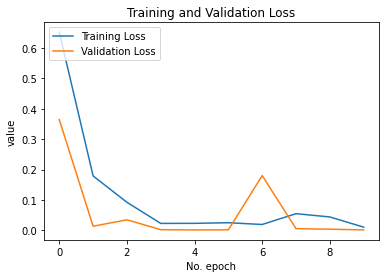

In [ ]:

# Plot history: MAE
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

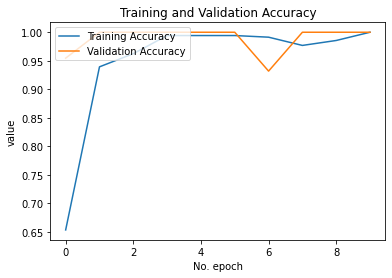

In [ ]:
# Plot history: MSE
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:

import os

In [ ]:
#MODEL_BASE_PATH = "model"
#PROJECT_NAME = "medium_project"
#SAVE_MODEL_NAME = "model.h5"
#save_model_path = os.path.join(MODEL_BASE_PATH, PROJECT_NAME, SAVE_MODEL_NAME)

#if os.path.exists(os.path.join(MODEL_BASE_PATH, PROJECT_NAME)) == False:
#    os.makedirs(os.path.join(MODEL_BASE_PATH, PROJECT_NAME))
    
#print('Saving Model At {}...'.format(save_model_path))
#model.save(save_model_path,include_optimizer=False)

In [ ]:
#loss, acc = model.evaluate(test_data,steps=len(test_generator),verbose=0)
#print('Accuracy on training data: {:.4f} \nLoss on training data: {:.4f}'.format(acc,loss),'\n')
 
#loss, acc = model.evaluate(test_data,steps=len(test_generator),verbose=0)
#print('Accuracy on test data: {:.4f} \nLoss on test data: {:.4f}'.format(acc,loss),'\n')

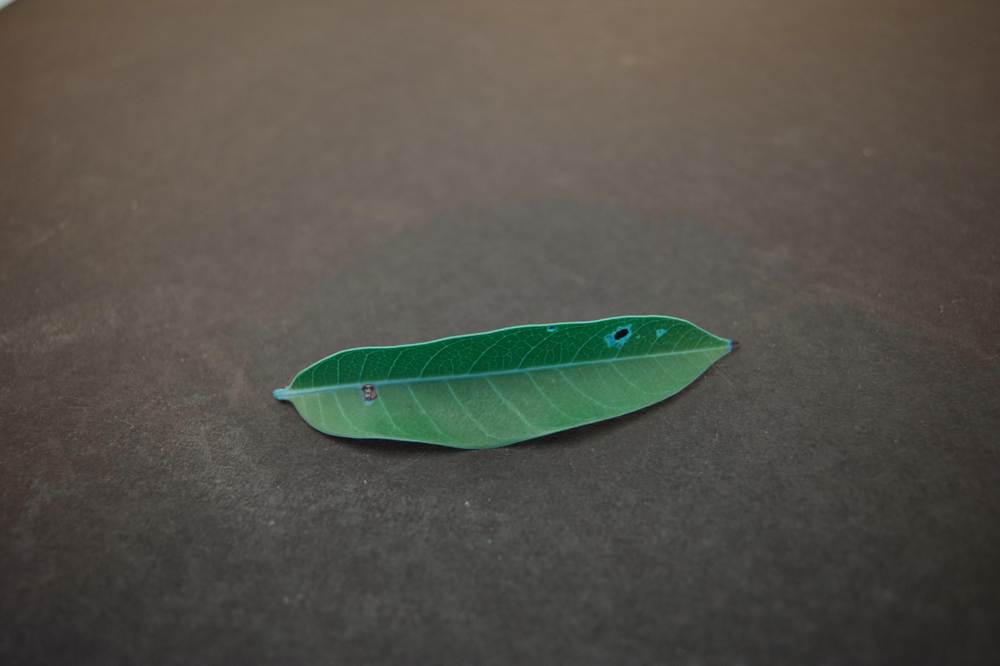

(224, 224, 3)
Predicted Class (0 - Disease , 1- Healthy):  0.49368766
Predicted: Disease


In [ ]:
from keras.preprocessing import image
model.load_weights('/content/drive/MyDrive/dMango/model_saved.h5')
from google.colab.patches import cv2_imshow


#image = load_img('/content/drive/MyDrive/v_data/test/cars/10.jpg', target_size=(227, 227))
images = image.load_img('/content/drive/MyDrive/dMango/test/diseased/0012_0005.JPG',target_size=(224, 224))
dt_test1 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/dMango/test/diseased/0012_0005.JPG'),cv2.COLOR_BGR2RGB)
#Images.open('/content/drive/MyDrive/Mango/test/diseased/0012_0027.JPG')
#image = images.convert('RGB')
#image = images.resize(input_shape, resample =0)
cv2_imshow(dt_test1)
print(input_shape)
img = np.array(images)
img = img / 255.0
img = img.reshape(1,224, 224,3)
label = model.predict(img)
#label = model.predict_classes(img)
print("Predicted Class (0 - Disease , 1- Healthy): ", label[0][0])

x = np.array (images)
x = np.expand_dims(x, axis=0)
array = model.predict(x)

result = array[0]
#print(result)
answer = np.argmax(result)
if label[0][0] <= 0.5:
  print("Predicted: Disease")
else:
  print("Predicted: Healthy")

In [ ]:
#Plot the confusion matrix. Set Normalize = True/False

import itertools 
from sklearn.metrics import classification_report, confusion_matrix

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
  plt.figure(figsize=(10,10))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=45)
  plt.yticks(tick_marks, classes)
  
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm = np.around(cm, decimals=2)
    cm[np.isnan(cm)] = 0.0
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
      plt.tight_layout()
      plt.ylabel('True label')
      plt.xlabel('Predicted label')


In [ ]:
target_names = []

for key in train_generator.class_indices:
  target_names.append(key)

#Confution Matrix 
Y_pred = model.predict_generator(valid_generator)
y_pred = np.argmax(Y_pred, axis=1)

print('Confusion Matrix')
cm = confusion_matrix(validation_generator.classes, y_pred)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')

#Print Classification Report
print('Classification Report')
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

#Confution Matrix 
Y_pred1 = model.predict_generator(train_generator)
y_pred1 = np.argmax(Y_pred1, axis=1)

print('Confusion Matrix')
cm1 = confusion_matrix(train_generator.classes, y_pred1)
plot_confusion_matrix(cm1, target_names, title='Confusion Matrix')

#Print Classification Report
print('Classification Report')
print(classification_report(validation_generator.classes, y_pred1, target_names=target_names))